In [1]:
import numpy as np
import scanpy as sc
import scvelo as scv
import matplotlib.pyplot as plt
import pandas as pd
from torchdiffeq import odeint
import torch
import torch.nn as nn
import warnings
from torch.utils.data import DataLoader
# Filter out DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
from scipy.stats import norm
import gc
import os
from IPython.display import clear_output
import time
import pickle
from scipy.interpolate import interp1d


Filtered out 47456 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.pro

Extracted 100 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:13) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


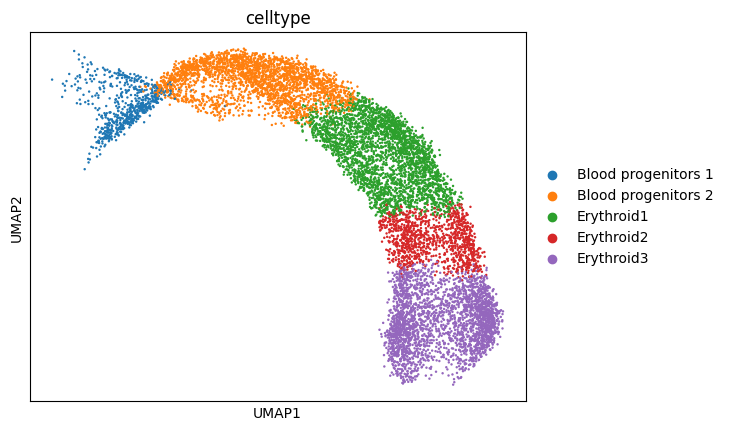

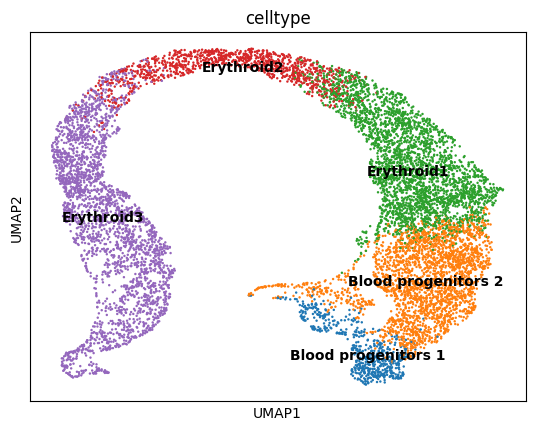

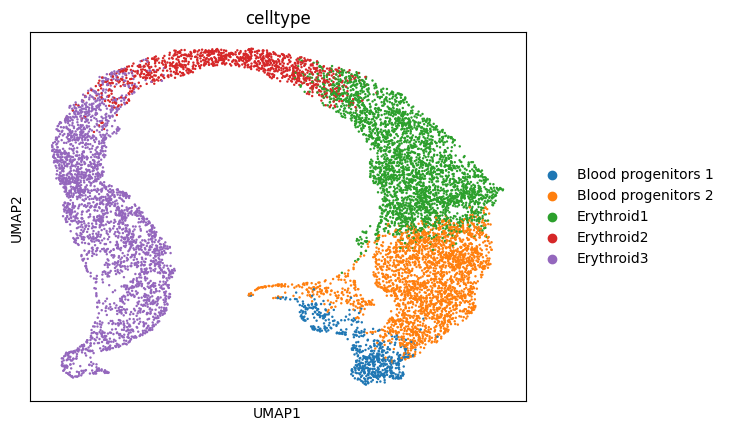

In [2]:

#AnnData for trajectory inference and cell dynamics analysis
dataset = scv.datasets.gastrulation_erythroid()

dataset.X = dataset.layers["spliced"]
dataset.layers["unspliced_counts"] = dataset.layers["unspliced"]
dataset.layers["spliced_counts"] = dataset.layers["spliced"]
scv.pp.filter_and_normalize(dataset, min_shared_counts=20, n_top_genes=100)
scv.pp.moments(dataset, n_pcs=30, n_neighbors=30)
#u_s_normalized = np.concatenate([dataset.layers["Mu"], dataset.layers["Ms"]], axis=1)
u_s_normalized = np.concatenate([dataset.layers["unspliced"].toarray(), dataset.layers["spliced"].toarray()], axis=1)
u_s_counts = np.concatenate([dataset.layers["unspliced_counts"].toarray(), dataset.layers["spliced_counts"].toarray()], axis=1)
mu_ms = np.concatenate([dataset.layers["Mu"], dataset.layers["Ms"]], axis=1)
adata = sc.AnnData(X=mu_ms)
adata.layers["u_s_counts"] = u_s_normalized
adata.layers["u_s_normalized"] = u_s_normalized
adata.layers["mu_ms"] = mu_ms

adata.obs = dataset.obs.copy()
var_names = dataset.var_names.copy()
adata.var_names = np.concatenate([var_names+"_u", var_names+"_s"])
adata.obsm["X_umap_original"] = dataset.obsm["X_umap"]
adata.obsm["X_umap"] = dataset.obsm["X_umap"]
sc.pl.umap(adata, color="celltype")
sc.pp.neighbors(adata, use_rep="X")
sc.tl.umap(adata)
adata.obsm["X_umap_new"] = adata.obsm["X_umap"]
keys = "celltype"
sc.pl.umap(adata, color=keys, legend_loc="on data")
sc.pl.umap(adata, color=keys)
adata.var_names = [name.lower().capitalize() for name in adata.var_names.tolist()]


In [3]:

# Assuming `adata` has been loaded with AnnData format
gene_names = adata.var_names
stages = np.unique(adata.obs["stage"])  # Get unique stages
cell_types = np.unique(adata.obs["celltype"])  # Get unique cell types
num_genes = len(gene_names)
num_stages = len(stages)
num_cell_types = len(cell_types)

In [4]:
import os

output_directory = 'output_directory_v2'  # Make sure to set this correctly
predicted_states_file = f'{output_directory}/predicted_states_output.pkl'
predicted_rates_file = f'{output_directory}/predicted_rates_output.pkl'

# Check if the files exist and their sizes
for file_path in [predicted_states_file, predicted_rates_file]:
    if os.path.exists(file_path):
        print(f"File: {file_path}, Size: {os.path.getsize(file_path)} bytes")
    else:
        print(f"File: {file_path} does not exist.")


try:
    with open(predicted_states_file, 'rb') as f:
        states_dic = pickle.load(f)
    with open(predicted_rates_file, 'rb') as f:
        rates_dic = pickle.load(f)
except EOFError:
    print("Encountered EOFError. The file might be empty or corrupted.")


File: output_directory_v2/predicted_states_output.pkl, Size: 63921 bytes
File: output_directory_v2/predicted_rates_output.pkl, Size: 63921 bytes


In [5]:
adata

AnnData object with n_obs × n_vars = 9815 × 200
    obs: 'sample', 'stage', 'sequencing.batch', 'theiler', 'celltype', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    uns: 'celltype_colors', 'neighbors', 'umap'
    obsm: 'X_umap_original', 'X_umap', 'X_umap_new'
    layers: 'u_s_counts', 'u_s_normalized', 'mu_ms'
    obsp: 'distances', 'connectivities'

In [6]:
from itertools import chain
#adata = adata[:,:-2]

velocity = np.zeros((len(adata), 200))
velocity_mu = np.zeros((len(adata), 200))
mean = np.zeros((len(adata), 200))
std = np.zeros((len(adata), 200))
for gene_ind in range(199):
    for i, stage in enumerate(stages):
        for j, ctype in enumerate(cell_types):
            condition = ((adata.obs["stage"] == stage) & (adata.obs["celltype"] == ctype))
            idx = np.where(condition)[0]
            velocity[idx,gene_ind] = np.full(len(idx), rates_dic[int(gene_ind)][i, j, 0])
            velocity_mu[idx,gene_ind] = np.full(len(idx), rates_dic[int(gene_ind)][i, j, 1])
            mean[idx,gene_ind] = np.full(len(idx), states_dic[int(gene_ind)][i, j, 0])
            std[idx,gene_ind] = np.full(len(idx), states_dic[int(gene_ind)][i, j, 1])

adata.layers["velocity"] = velocity
adata.layers["velocity_mu"] = velocity_mu
adata.layers["mean"] = mean
adata.layers["std"] = std



In [7]:
import numpy as np
import matplotlib.pyplot as plt

def plot_phase_plane(adata, name, u_scale=.1, s_scale=0.1, alpha=0.5, head_width=0.02, head_length=0.03, length_includes_head=False, log=False,
                        norm_velocity=True, filter_cells=False, smooth_expr=True):
    gene_name = name.lower().capitalize()
    unspliced_index = gene_name + "_u"
    spliced_index = gene_name + "_s"

    if smooth_expr:
        unspliced_expression = adata.layers["mu_ms"][:, adata.var_names.get_loc(unspliced_index)].flatten()
        spliced_expression = adata.layers["mu_ms"][:, adata.var_names.get_loc(spliced_index)].flatten()
    else:
        unspliced_expression = adata.layers["u_s_normalized"][:, adata.var_names.get_loc(unspliced_index)].flatten()
        spliced_expression = adata.layers["u_s_normalized"][:, adata.var_names.get_loc(spliced_index)].flatten()

    # Normalize the expression data
    unspliced_expression_min, unspliced_expression_max = np.min(unspliced_expression), np.max(unspliced_expression)
    spliced_expression_min, spliced_expression_max = np.min(spliced_expression), np.max(spliced_expression)

    # Min-Max normalization
    unspliced_expression = (unspliced_expression - unspliced_expression_min) / (unspliced_expression_max - unspliced_expression_min)
    spliced_expression = (spliced_expression - spliced_expression_min) / (spliced_expression_max - spliced_expression_min)

    # Extract the velocity data
    unspliced_velocity = adata.layers['velocity'][:, adata.var_names.get_loc(unspliced_index)].flatten()
    spliced_velocity = adata.layers['velocity'][:, adata.var_names.get_loc(spliced_index)].flatten()

    def custom_scale(data):
        max_abs_value = np.max(np.abs(data))  # Find the maximum absolute value
        scaled_data = data / max_abs_value  # Scale by the maximum absolute value
        return scaled_data

    if norm_velocity:
        unspliced_velocity = custom_scale(unspliced_velocity)
        spliced_velocity = custom_scale(spliced_velocity)


    # Apply any desired transformations (e.g., log) here
    if log:
        # Apply log transformation safely, ensuring no log(0)
        unspliced_velocity = np.log1p(unspliced_velocity)
        spliced_velocity = np.log1p(spliced_velocity)

    # Generate boolean masks for conditions and apply them
    if filter_cells:
        valid_idx = (unspliced_expression > 0) & (spliced_expression > 0)
    else:
        valid_idx = (unspliced_expression >= 0) & (spliced_expression >= 0)

    # Filter data based on valid_idx
    unspliced_expression_filtered = unspliced_expression[valid_idx]
    spliced_expression_filtered = spliced_expression[valid_idx]
    unspliced_velocity_filtered = unspliced_velocity[valid_idx]
    spliced_velocity_filtered = spliced_velocity[valid_idx]

    # Also filter cell type information to match the filtered expressions
    # First, get unique cell types and their corresponding colors
    unique_cell_types = adata.obs['celltype'].cat.categories
    celltype_colors = adata.uns["celltype_colors"]
    
    # Create a mapping of cell type to its color
    celltype_to_color = dict(zip(unique_cell_types, celltype_colors))

    # Filter cell types from the data to get a list of colors for the filtered data points
    cell_types_filtered = adata.obs['celltype'][valid_idx]
    colors = cell_types_filtered.map(celltype_to_color).to_numpy()
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(unspliced_expression_filtered, spliced_expression_filtered, c=colors, alpha=0.6)

    # Plot velocity vectors
    for i in range(len(unspliced_expression_filtered)):
        cell_type_index = np.where(unique_cell_types == cell_types_filtered[i])[0][0]
        arrow_color = celltype_to_color[cell_types_filtered[i]]  # Use the color corresponding to the cell type
        plt.arrow(
            unspliced_expression_filtered[i], spliced_expression_filtered[i], 
            unspliced_velocity_filtered[i] * u_scale, spliced_velocity_filtered[i] * s_scale, 
            color=arrow_color, alpha=alpha, head_width=head_width, head_length=head_length, length_includes_head=length_includes_head
        )

    plt.xlabel(f'Normalized Unspliced Expression of {gene_name}')
    plt.ylabel(f'Normalized Spliced Expression of {gene_name}')
    plt.title(f'Expression and Velocity of {gene_name} by Cell Type')

    # Create a legend
    patches = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=celltype_to_color[celltype], markersize=10, label=celltype) 
            for celltype in unique_cell_types]
    plt.legend(handles=patches, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


In [8]:
stage_labels = ['E7.0', 'E7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25', 'E8.5']  # Example stage labels

# Assuming 'adata' is your original AnnData object
unique_stages = pd.unique(adata.obs["stage"].values)

# Dictionary to hold the subsetted AnnData objects
stage_specific_adatas = {}

for stage in unique_stages:
    # Subset the AnnData object for the current stage
    stage_adata = adata[adata.obs["stage"] == stage].copy()
    
    # Store the subsetted AnnData object in the dictionary
    stage_specific_adatas[stage] = stage_adata

E700 = stage_specific_adatas['E7.0']
E725 = stage_specific_adatas['E7.25']
E750 = stage_specific_adatas['E7.5']
E775 = stage_specific_adatas['E7.75']
E800 = stage_specific_adatas['E8.0']
E825 = stage_specific_adatas['E8.25']
E850 = stage_specific_adatas['E8.5']

adata_stages = [E700, E725, E750, E775, E800, E825, E850]
gnames = [name[:-2] for name in adata.var_names]


computing velocity graph (using 1/24 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


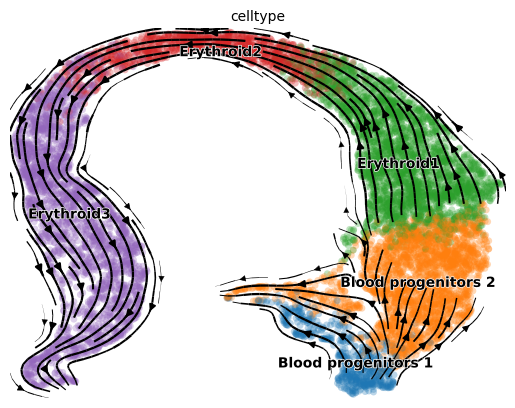

In [9]:
adata.layers["spliced"] = adata.layers["mu_ms"]
sc.pp.neighbors(adata, use_rep="X")
scv.tl.velocity_graph(adata, vkey="velocity")
scv.pl.velocity_embedding_stream(adata, vkey="velocity", color="celltype")

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


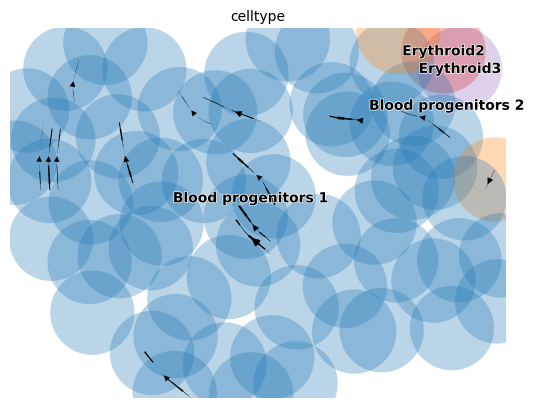

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


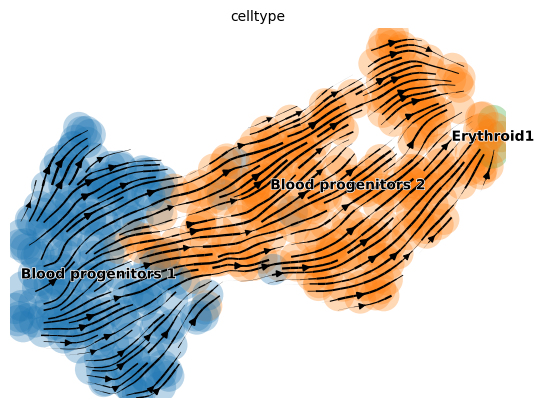

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


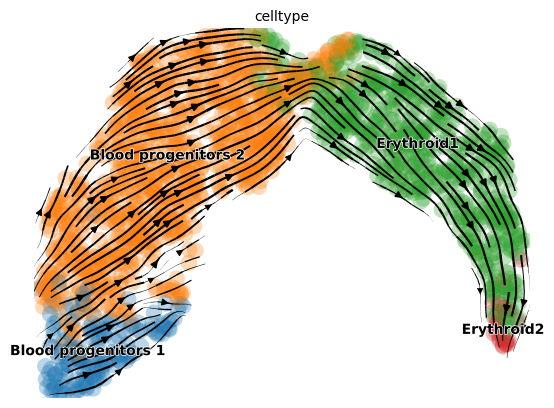

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


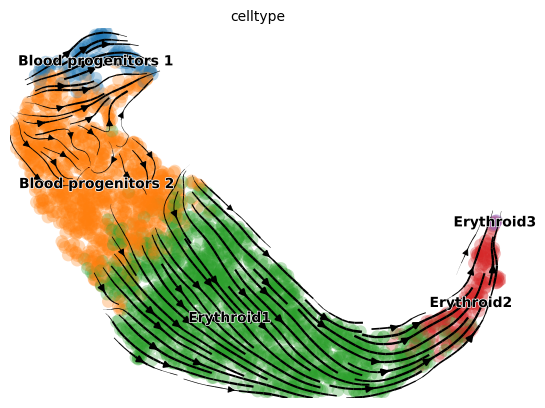

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


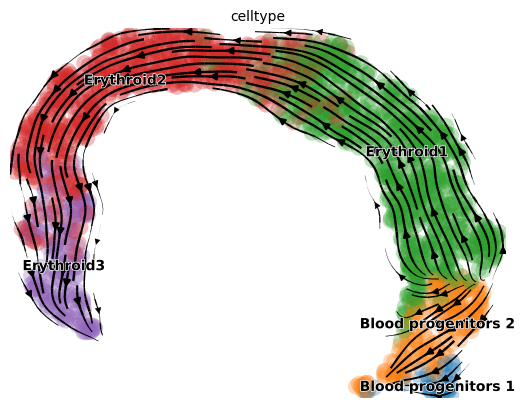

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


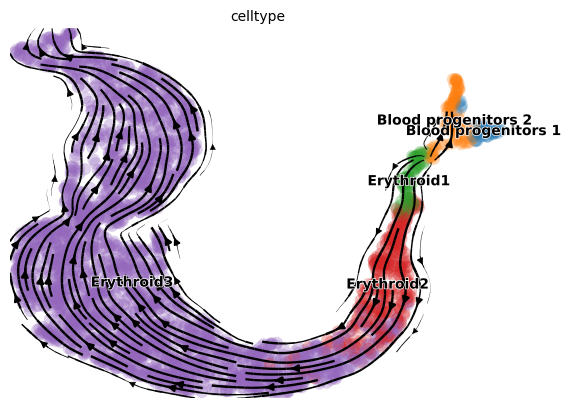

In [10]:
for adata_stage in adata_stages[1:]:
    adata_stage = adata_stage.copy()
    adata_stage.layers["spliced"] = adata_stage.layers["mu_ms"]
    sc.pp.neighbors(adata_stage, use_rep="X")
    sc.tl.umap(adata_stage)
    scv.tl.velocity_graph(adata_stage, vkey="velocity")
    scv.pl.velocity_embedding_stream(adata_stage, vkey="velocity", color="celltype")

In [11]:
"""for adata_stage in adata_stages[1:]:
    noise = np.random.normal(0, 1e-6, adata_stage.shape)
    adata_stage = adata_stage.copy()
    adata_stage.X = adata_stage.layers["velocity"] + noise
    adata_stage.layers["spliced"] = adata_stage.layers["velocity"] + noise
    sc.pp.neighbors(adata_stage, use_rep="X")
    sc.tl.umap(adata_stage)
    scv.tl.velocity_graph(adata_stage, vkey="velocity")
    scv.pl.velocity_embedding_stream(adata_stage, vkey="velocity", color="celltype")"""

'for adata_stage in adata_stages[1:]:\n    noise = np.random.normal(0, 1e-6, adata_stage.shape)\n    adata_stage = adata_stage.copy()\n    adata_stage.X = adata_stage.layers["velocity"] + noise\n    adata_stage.layers["spliced"] = adata_stage.layers["velocity"] + noise\n    sc.pp.neighbors(adata_stage, use_rep="X")\n    sc.tl.umap(adata_stage)\n    scv.tl.velocity_graph(adata_stage, vkey="velocity")\n    scv.pl.velocity_embedding_stream(adata_stage, vkey="velocity", color="celltype")'

gene: Fn1, stage: E7.0


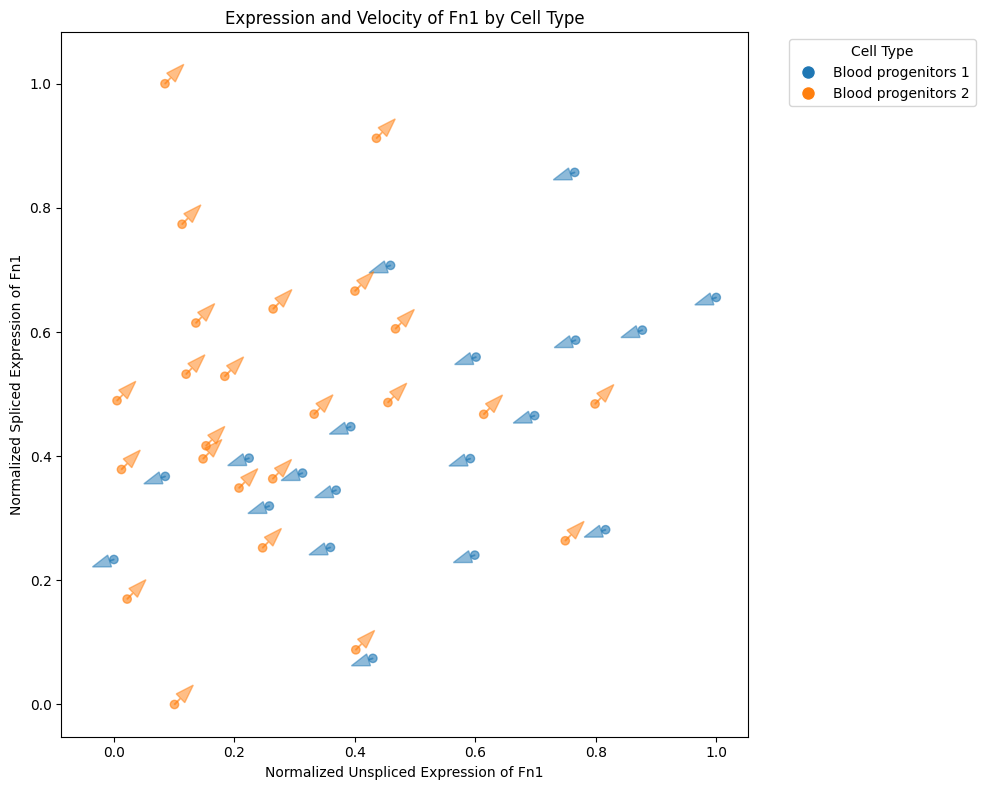

gene: Fn1, stage: E7.25


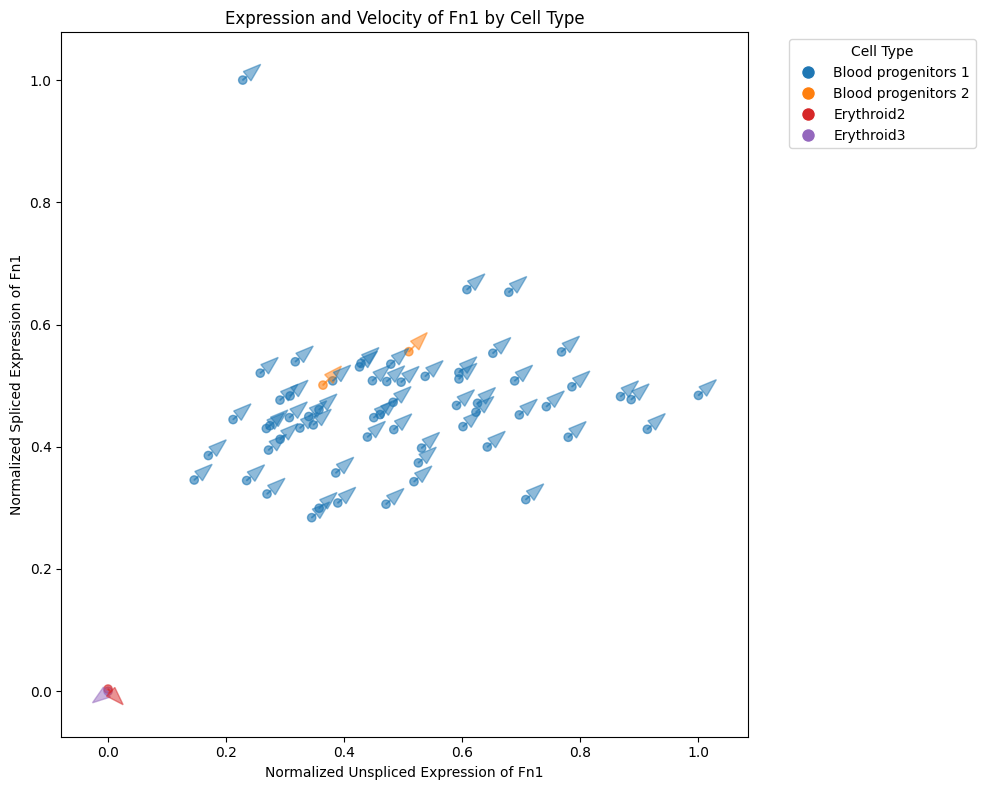

gene: Fn1, stage: E7.5


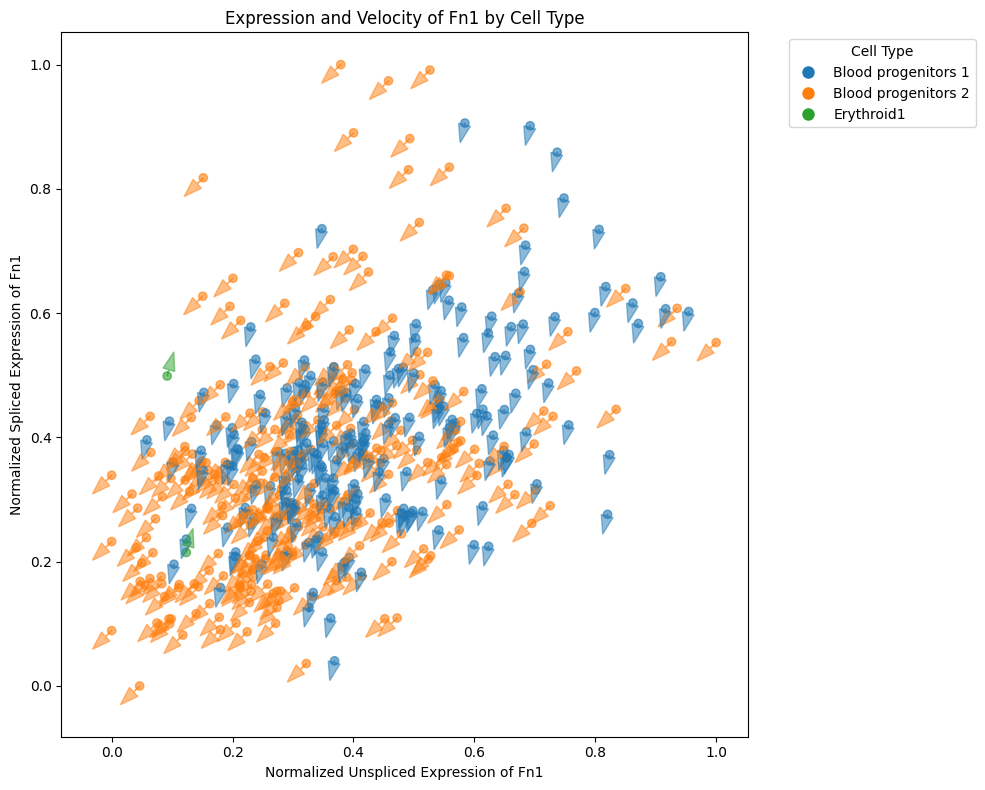

gene: Fn1, stage: E7.75


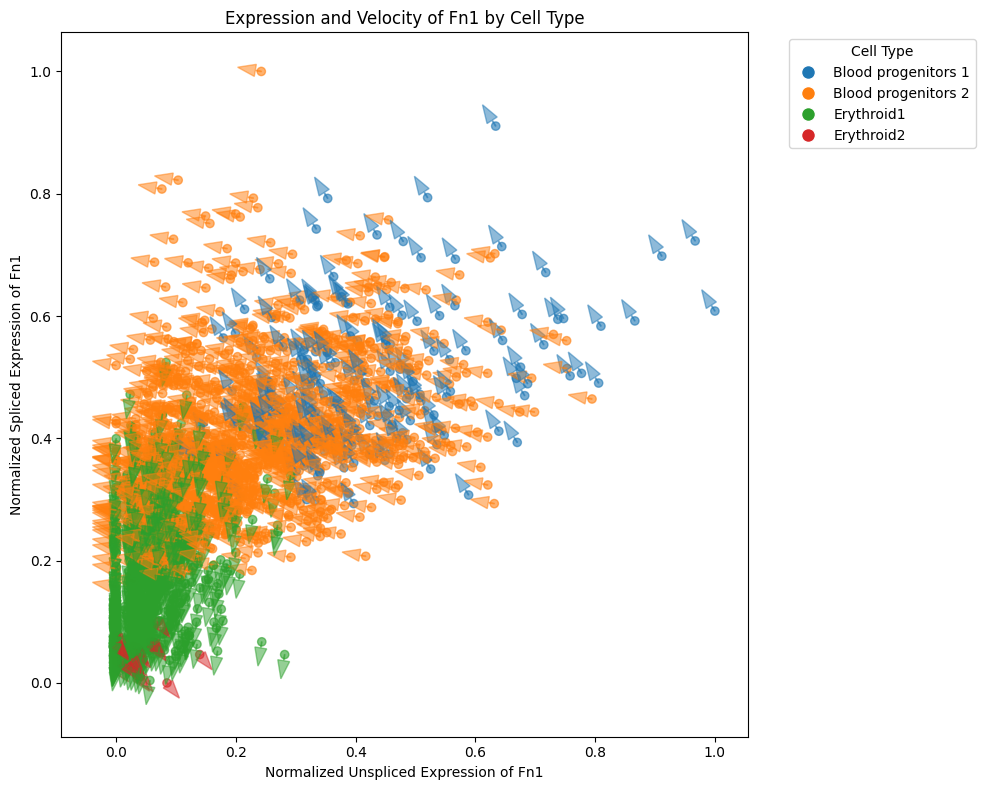

gene: Fn1, stage: E8.0


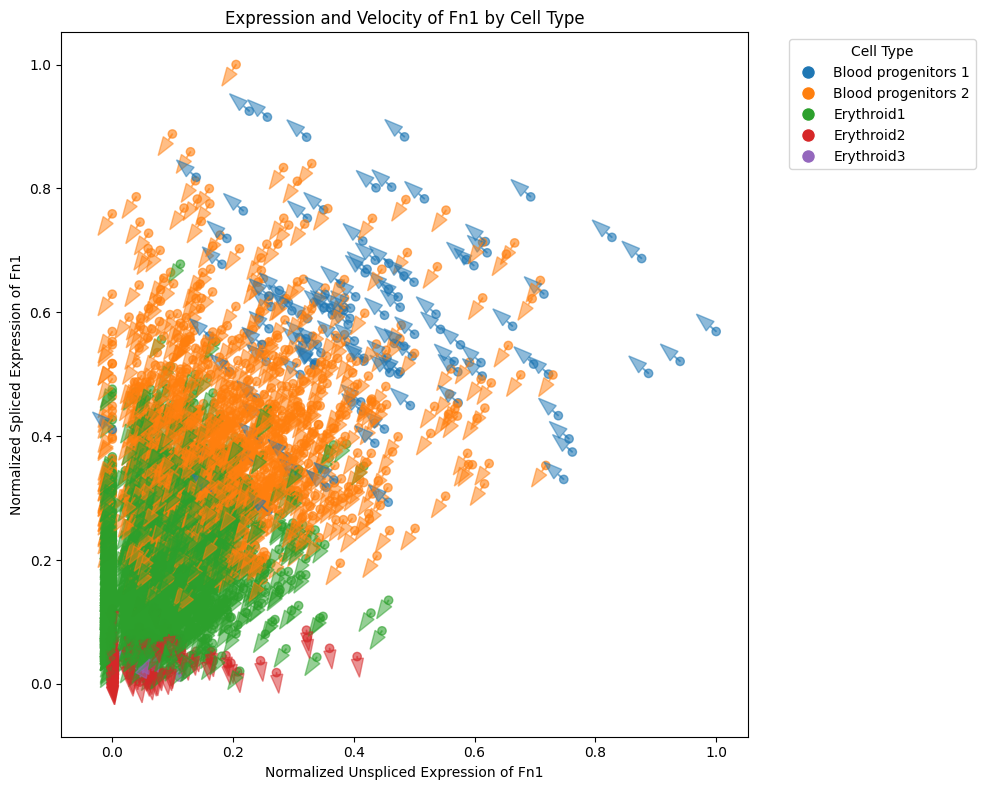

gene: Fn1, stage: E8.25


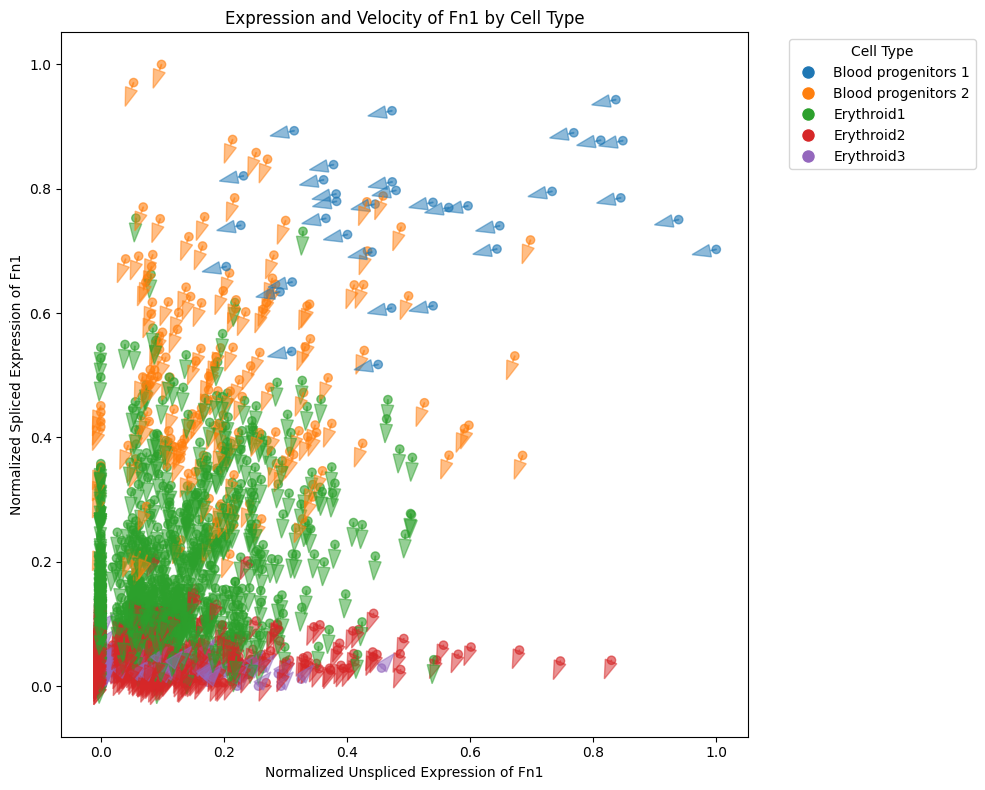

gene: Fn1, stage: E8.5


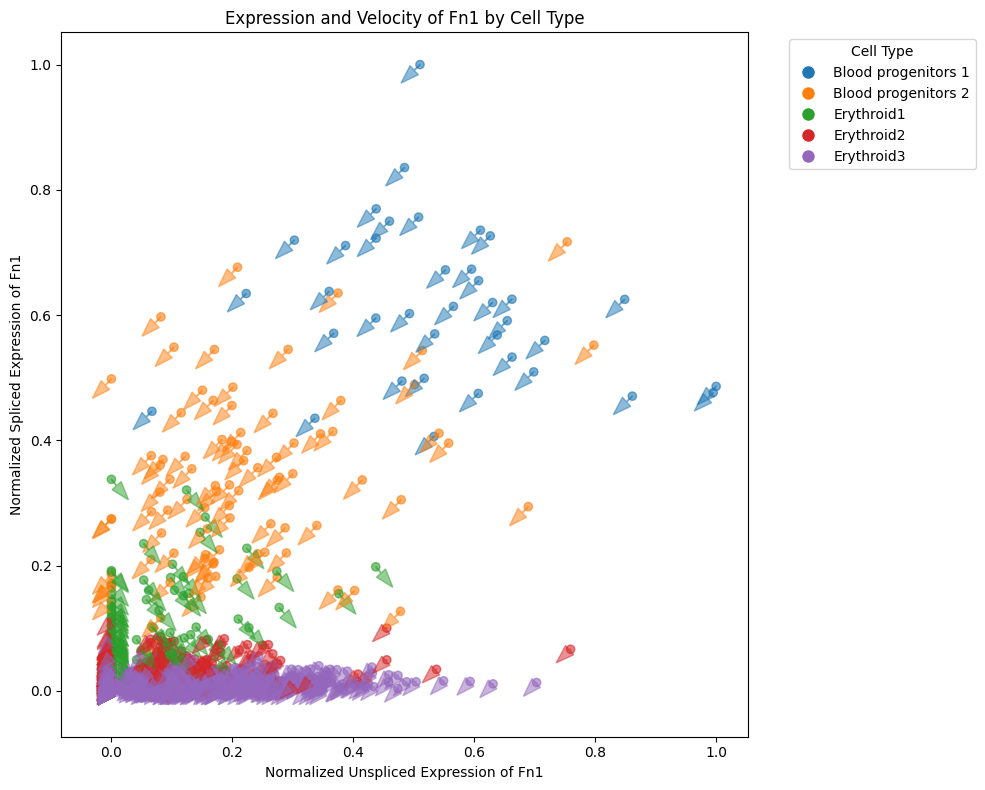

In [12]:
for gname in gnames[:1]:
    for i, adata_stage in enumerate(adata_stages):
        print(f"gene: {gname}, stage: {stage_labels[i]}")
        plot_phase_plane(adata_stage, gname, u_scale=.01, s_scale=0.01, alpha=0.5)

gene: Ttr


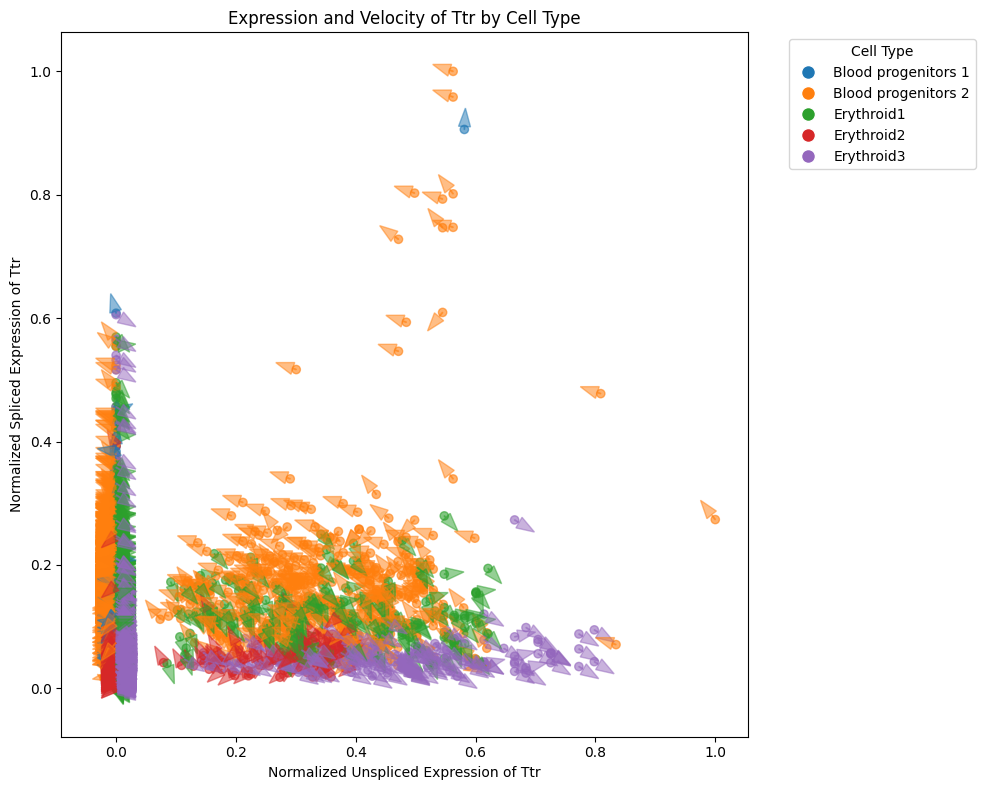

gene: Tubb6


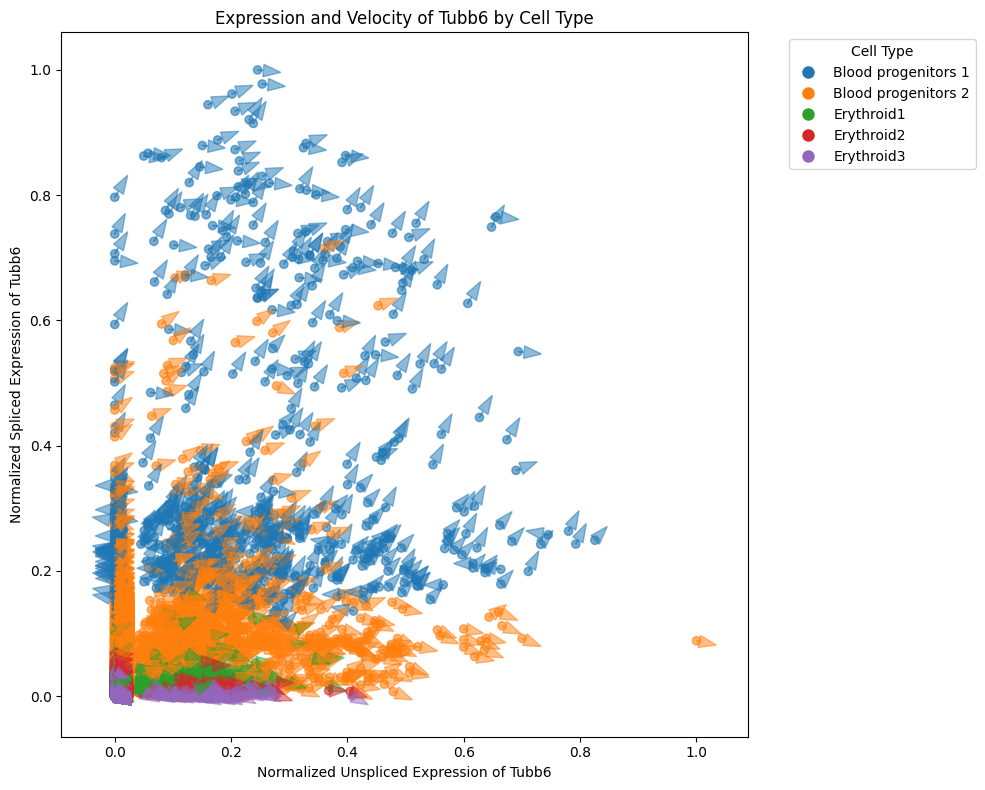

gene: Malat1


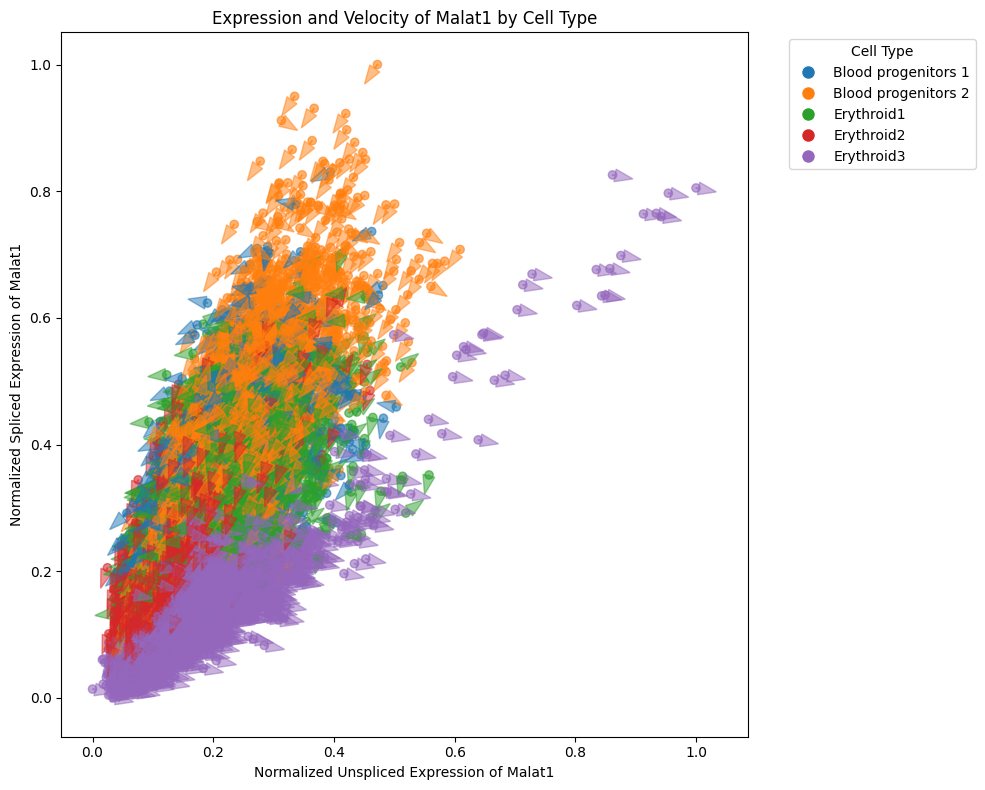

gene: Sla2


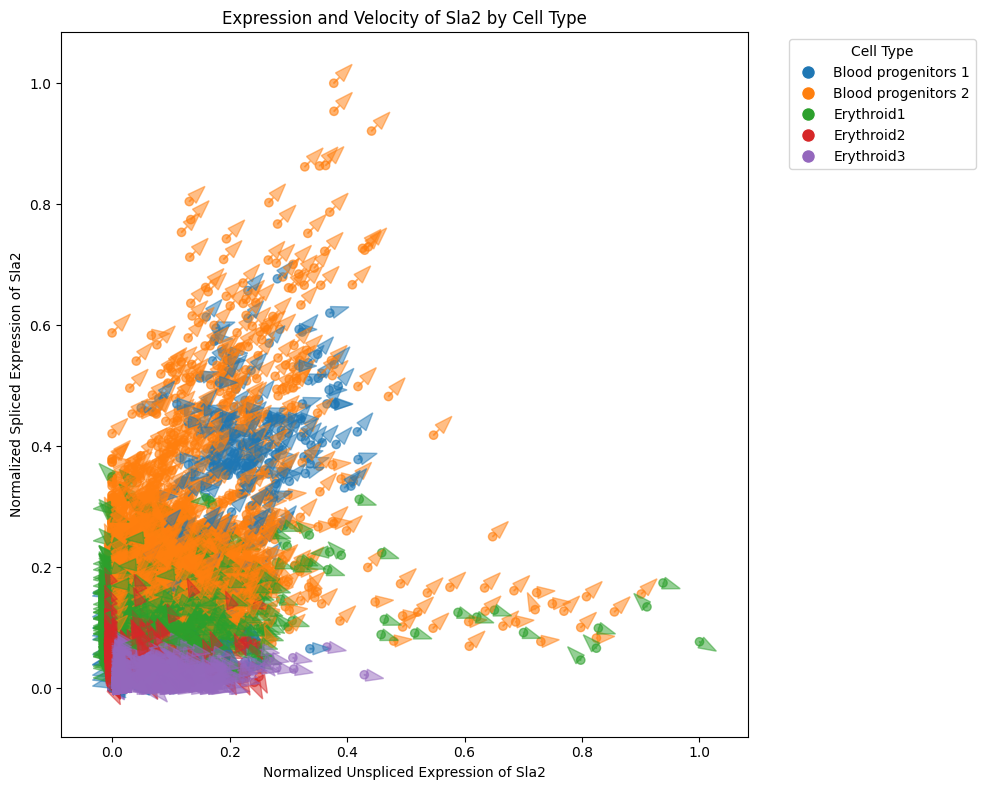

gene: Vim


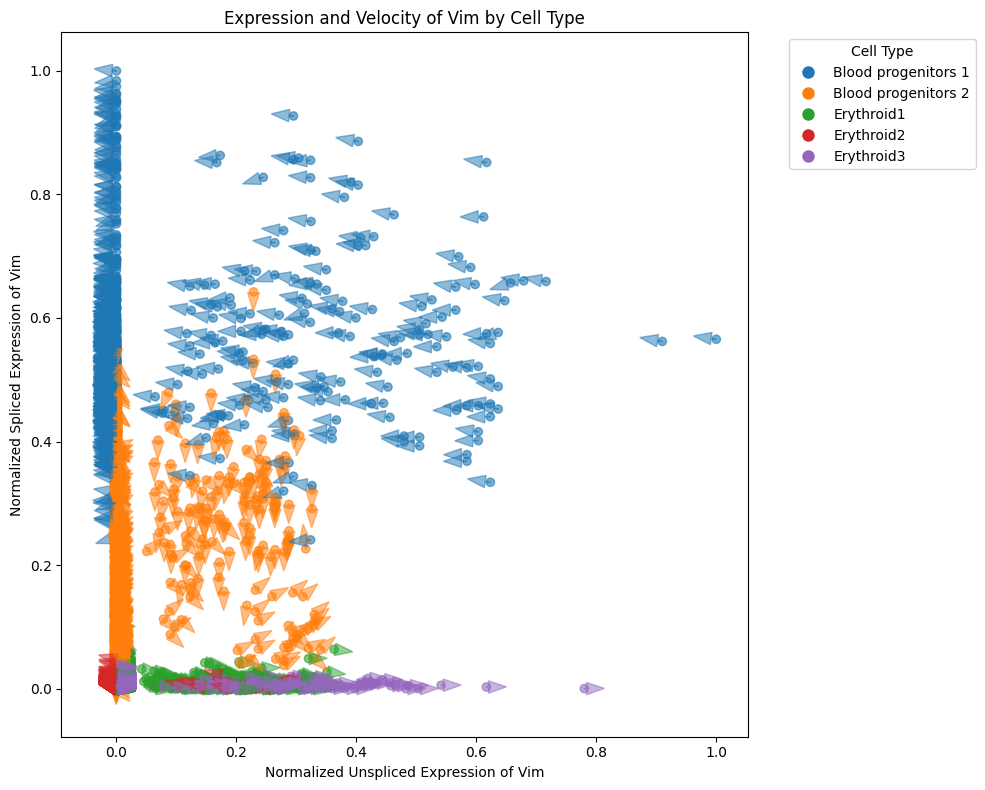

gene: Spi1


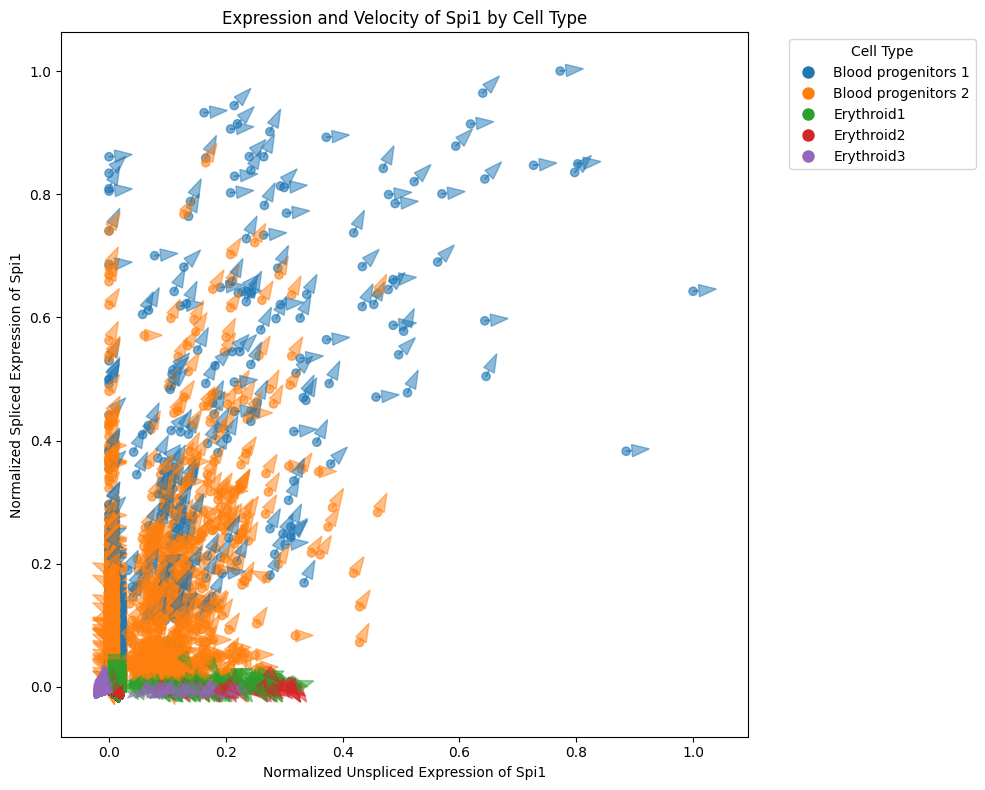

gene: Lmo2


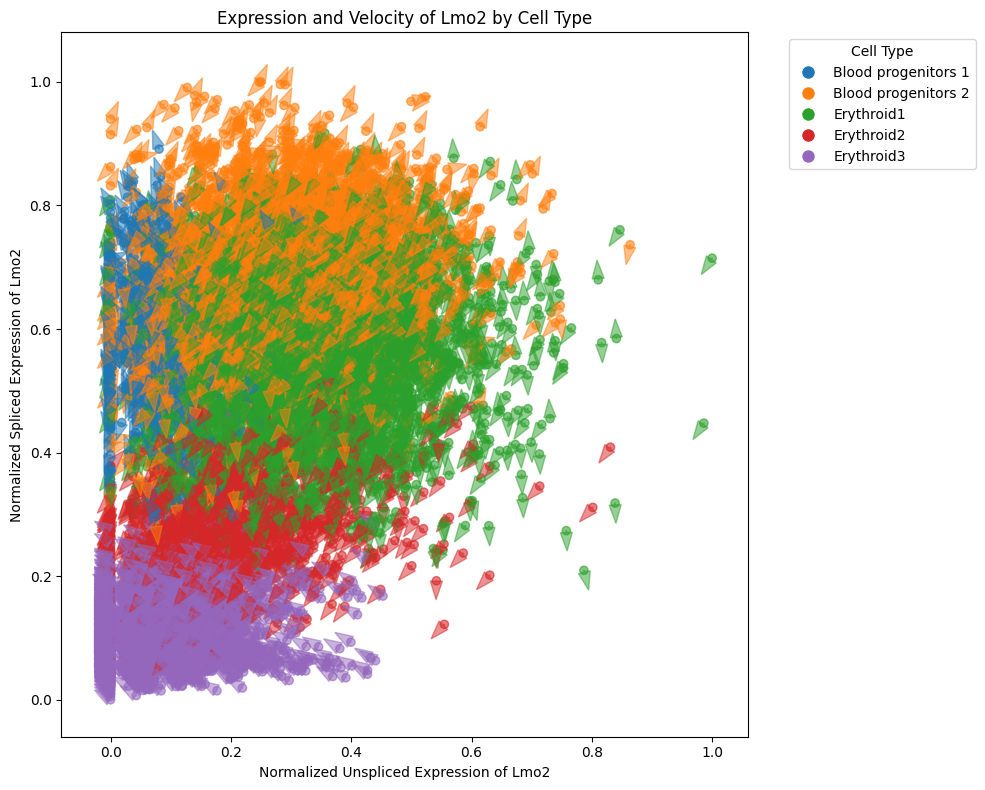

gene: B2m


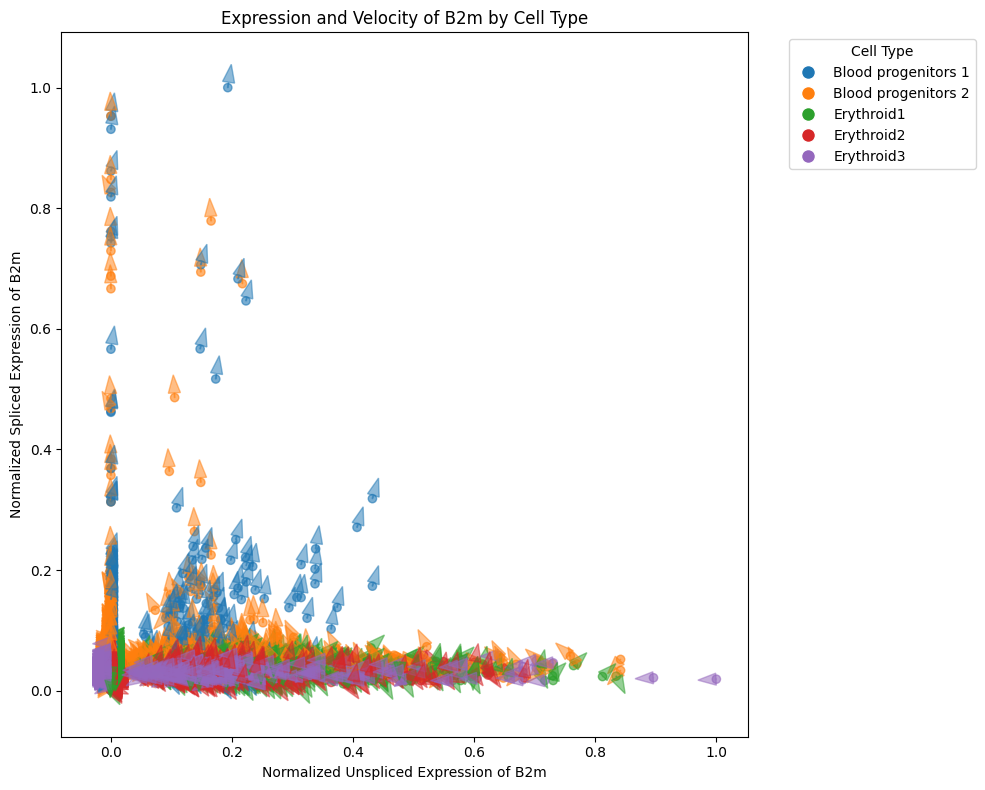

gene: Car1


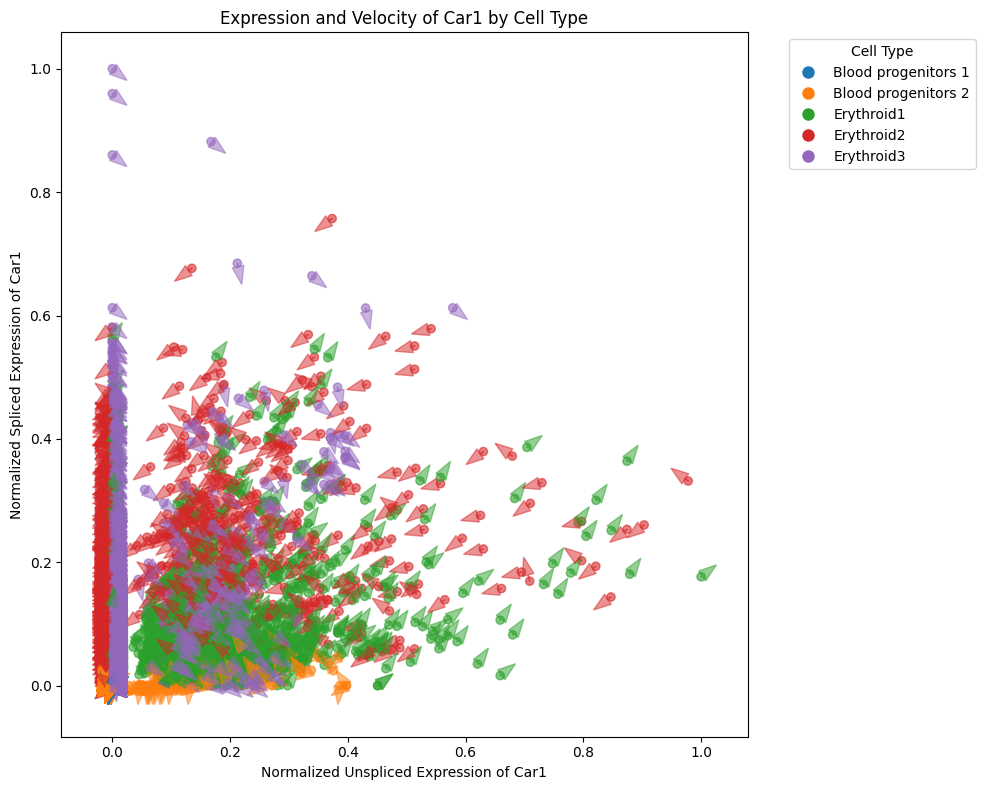

gene: Hsd3b6


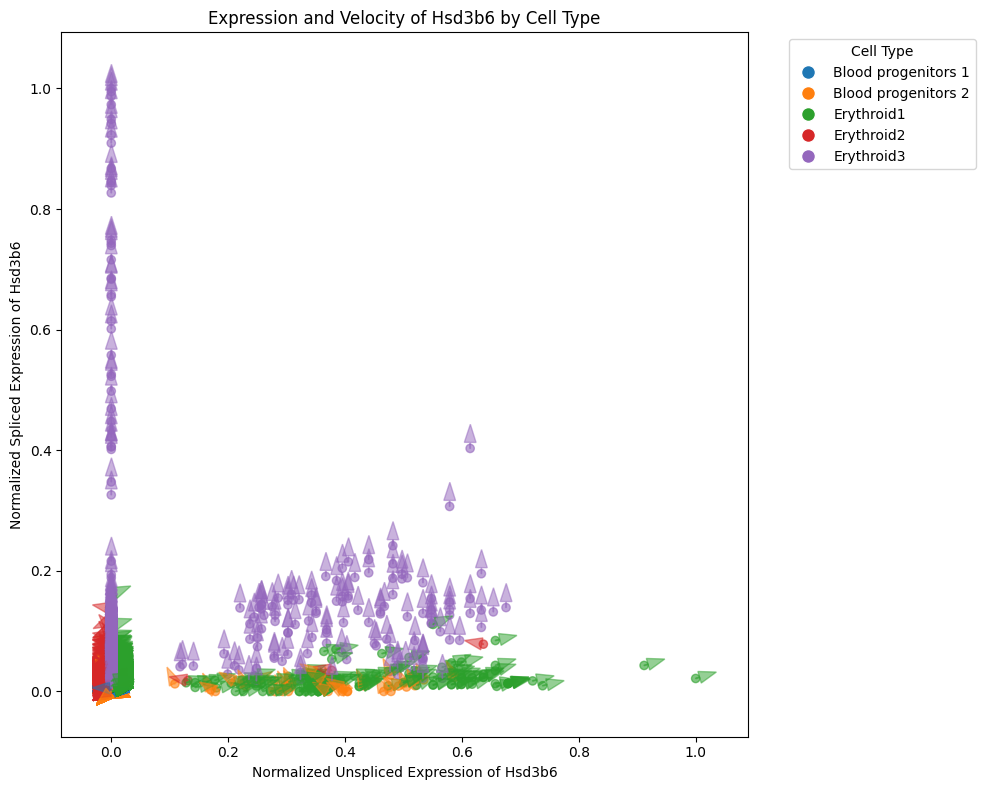

In [13]:
for gname in gnames[40:50]:
    print(f"gene: {gname}")
    plot_phase_plane(adata, gname, u_scale=.01, s_scale=0.01, alpha=0.5)

/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use

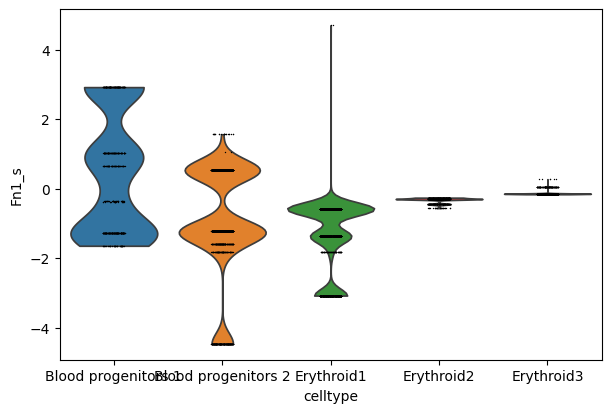

/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use

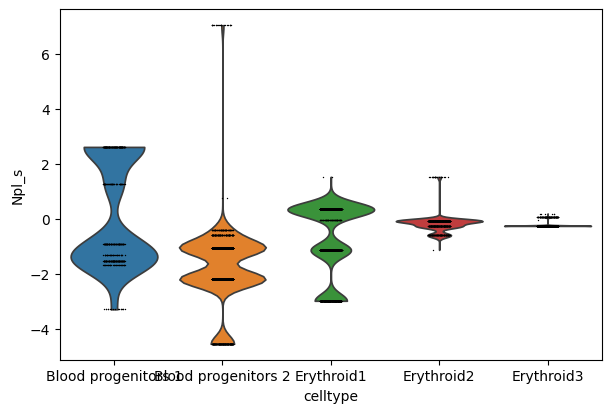

/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use

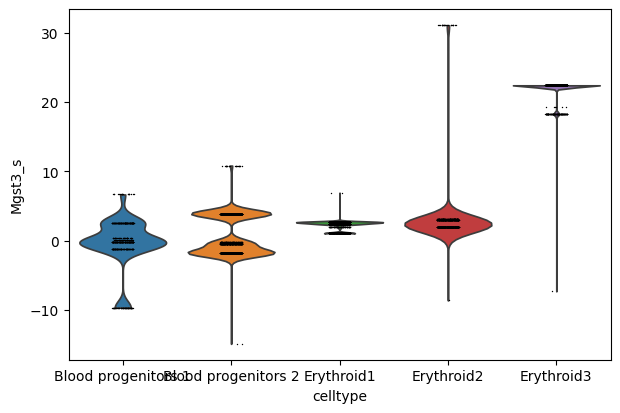

In [14]:
for j, gname in enumerate(gnames[:3]):
    sc.pl.violin(adata, gname+"_s", layer="velocity", groupby="celltype")

0) try plotting velocity embedding by first adding small random noise to velocity
1) do a continuus version of the latter plot
2) generate the dataset using the states

In [15]:
class ODEFunc(nn.Module):
    def __init__(self):
        super(ODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(10, 50), 
            nn.Tanh(),
            nn.Linear(50, 10)  
        )

    def forward(self, t, y):
        return self.net(y)


In [16]:
synthetic_states = np.zeros((500, 200)) #celltype*time by genes
synthetic_rates = np.zeros((500, 200)) #celltype*time by genes
predicted_mu = np.zeros((500, 200))
predicted_std = np.zeros((500, 200))
synthetic_rates_std = np.zeros((500, 200))

t = torch.linspace(0,1,steps=100)

for gene_ind in range(200):
    print(gene_ind)
    model = ODEFunc()
    model.load_state_dict(torch.load(f'models_erythroid_v2/best_model_gene_{gene_ind}.pt'))
    model.eval()
    with torch.no_grad():
        states = torch.tensor(states_dic[gene_ind].reshape(70))
        initial_states = states[:10]
        predicted_states = odeint(model, initial_states, t)
        predicted_rates = model(t, predicted_states).reshape(100,5,2)
        predicted_states = predicted_states.reshape(100,5,2)


        for ctype_ind in range(5):
            mu = predicted_states[:,ctype_ind,0]
            #std = np.absolute(predicted_states[:,ctype_ind,1])
            std = np.maximum(predicted_states[:,ctype_ind,1],0)
            sample_size = 100
            synthetic_cell_states = np.random.normal(mu, std, sample_size)
            synthetic_cell_rates = predicted_rates[:,ctype_ind,0]
            synthetic_cell_rates_std = predicted_rates[:,ctype_ind,1]
            cells_idx = list(range(ctype_ind*100,+(ctype_ind+1)*100))
            synthetic_states[cells_idx,gene_ind] = synthetic_cell_states
            synthetic_rates[cells_idx,gene_ind] = synthetic_cell_rates
            synthetic_rates_std[cells_idx,gene_ind] = synthetic_cell_rates_std
            predicted_mu[cells_idx,gene_ind] = mu
            predicted_std[cells_idx,gene_ind] = std
        


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


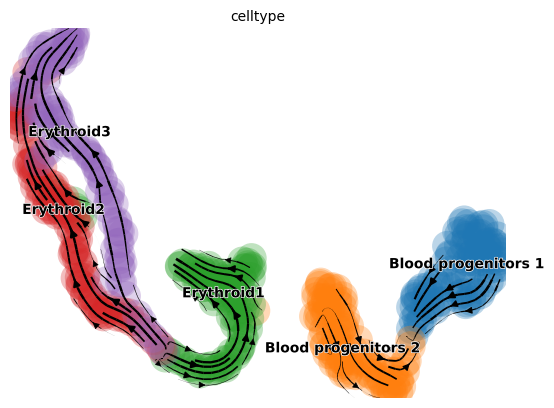

In [17]:
synthetic_dataset = sc.AnnData(X=synthetic_states)
synthetic_dataset.layers["spliced"] = synthetic_states
synthetic_dataset.layers["velocity"] = synthetic_rates
synthetic_dataset.obs["celltype"] = np.repeat(cell_types, 100)
synthetic_dataset.var_names = adata.var_names.copy()
sc.pp.neighbors(synthetic_dataset,use_rep="X")
sc.tl.umap(synthetic_dataset)
scv.tl.velocity_graph(synthetic_dataset, vkey="velocity")
scv.pl.velocity_embedding_stream(synthetic_dataset, vkey="velocity", color="celltype")

computing velocity graph (using 1/24 cores)
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/mnt/data2/home/leonardo/miniconda3/envs/DeepTrajectory/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


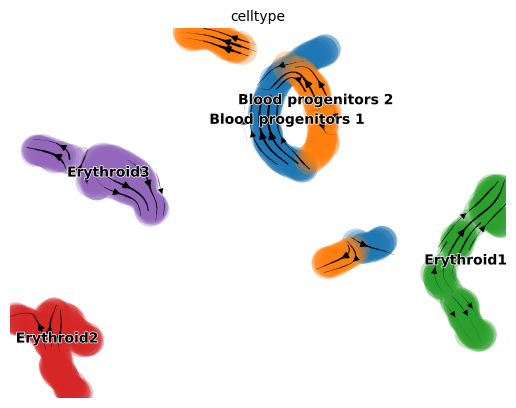

In [18]:
synthetic_dataset_rates = sc.AnnData(X=synthetic_rates)
synthetic_dataset_rates.layers["spliced"] = synthetic_rates
synthetic_dataset_rates.layers["velocity"] = synthetic_rates
synthetic_dataset_rates.obs["celltype"] = np.repeat(cell_types, 100)
synthetic_dataset_rates.var_names = adata.var_names.copy()
sc.pp.neighbors(synthetic_dataset_rates,use_rep="X")
sc.tl.umap(synthetic_dataset_rates)
scv.tl.velocity_graph(synthetic_dataset_rates, vkey="velocity")
scv.pl.velocity_embedding_stream(synthetic_dataset_rates, vkey="velocity", color="celltype")

In [19]:
expr_dic_100 = {}
std_dic_100 = {}
synth_states_dic_100 = {}
synth_rates_dic_100 = {}
predicted_mu_dic_100 = {}
predicted_std_dic_100 = {}
synth_rates_std_dic_100 = {}

import warnings
    
for ctype_ind, ctype in enumerate(cell_types):
    ctype_idx_synthetic = np.where(synthetic_dataset.obs == ctype)[0]
    synth_states_dic_100[ctype_ind] = {}
    synth_rates_dic_100[ctype_ind] = {}
    synth_rates_std_dic_100[ctype_ind] = {}
    
    expr_dic_100[ctype_ind] = {}
    std_dic_100[ctype_ind] = {}
    predicted_mu_dic_100[ctype_ind]= {}
    predicted_std_dic_100[ctype_ind] = {}
    for gene_idx, gname in enumerate(gnames):
        tmp_expr_array = np.array([])
        tmp_std_array = np.array([])

        expr_dic_100[ctype_ind][gene_idx] = np.array([])
        for i, adata_stage in enumerate(adata_stages):
            if (adata_stage.obs["celltype"]==ctype).sum() > 0:
                expr_value = adata_stage[adata_stage.obs["celltype"]==ctype,gene_idx].layers["mean"][0,0]
                std_value = adata_stage[adata_stage.obs["celltype"]==ctype,gene_idx].layers["std"][0,0]
                tmp_expr_array = np.append(tmp_expr_array, expr_value)
                tmp_std_array = np.append(tmp_std_array, std_value)
            else:
                expr_value = 0
                std_value = 0
                tmp_expr_array = np.append(tmp_expr_array, expr_value)
                tmp_std_array = np.append(tmp_std_array, std_value)

        t_expr = np.linspace(0, 1, len(tmp_expr_array))
        f_interp = interp1d(t_expr, tmp_expr_array, kind='linear')
        expr_dic_100[ctype_ind][gene_idx] = f_interp(t)
        f_interp = interp1d(t_expr, tmp_std_array, kind='linear')
        std_dic_100[ctype_ind][gene_idx] = f_interp(t)
            
    
        synth_states_dic_100[ctype_ind][gene_idx] = synthetic_states[ctype_idx_synthetic,gene_idx]
        synth_rates_dic_100[ctype_ind][gene_idx] = synthetic_rates[ctype_idx_synthetic,gene_idx]
        predicted_mu_dic_100[ctype_ind][gene_idx] = predicted_mu[ctype_idx_synthetic,gene_idx]
        predicted_std_dic_100[ctype_ind][gene_idx] = predicted_std[ctype_idx_synthetic,gene_idx]
        synth_rates_std_dic_100[ctype_ind][gene_idx] = synthetic_rates_std[ctype_idx_synthetic,gene_idx]





In [20]:
"""gene_idx = 2
gname = adata.var_names[gene_idx]
for ctype_ind, ctype in enumerate(cell_types):
    plt.figure(figsize=(10,5))
    plt.plot(t, expr_dic_100[ctype_ind][gene_idx],"--")
    plt.plot(t, synth_states_dic_100[ctype_ind][gene_idx], "o")
    plt.plot(t, synth_rates_dic_100[ctype_ind][gene_idx])
    plt.legend(["measured_expression","sampled_predicted_expression", "predicted_velocity"])
    plt.title(f"cell type: {ctype} gene: {gname} at index: {gene_idx}")



#plt.plot(stage_labels, np.array(expr).reshape(7))"""

'gene_idx = 2\ngname = adata.var_names[gene_idx]\nfor ctype_ind, ctype in enumerate(cell_types):\n    plt.figure(figsize=(10,5))\n    plt.plot(t, expr_dic_100[ctype_ind][gene_idx],"--")\n    plt.plot(t, synth_states_dic_100[ctype_ind][gene_idx], "o")\n    plt.plot(t, synth_rates_dic_100[ctype_ind][gene_idx])\n    plt.legend(["measured_expression","sampled_predicted_expression", "predicted_velocity"])\n    plt.title(f"cell type: {ctype} gene: {gname} at index: {gene_idx}")\n\n\n\n#plt.plot(stage_labels, np.array(expr).reshape(7))'

2) try kl divergence loss
3) try multivariate normal with kl divergence loss
4) Aumentare il numero di geni e\o selezionarli meglio potrebbe migliorare i risultati

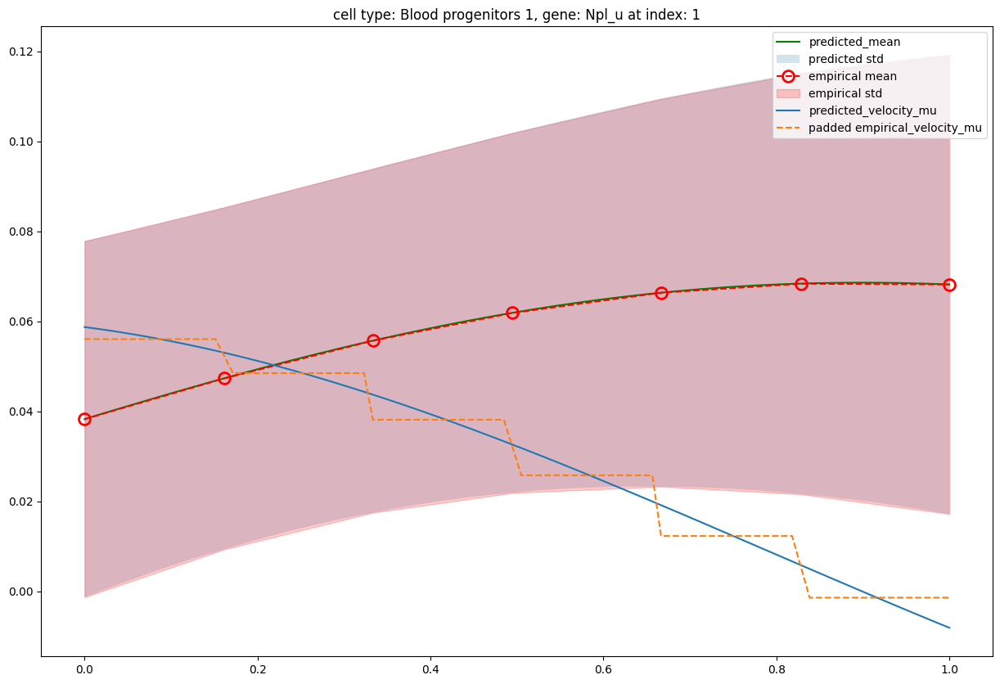

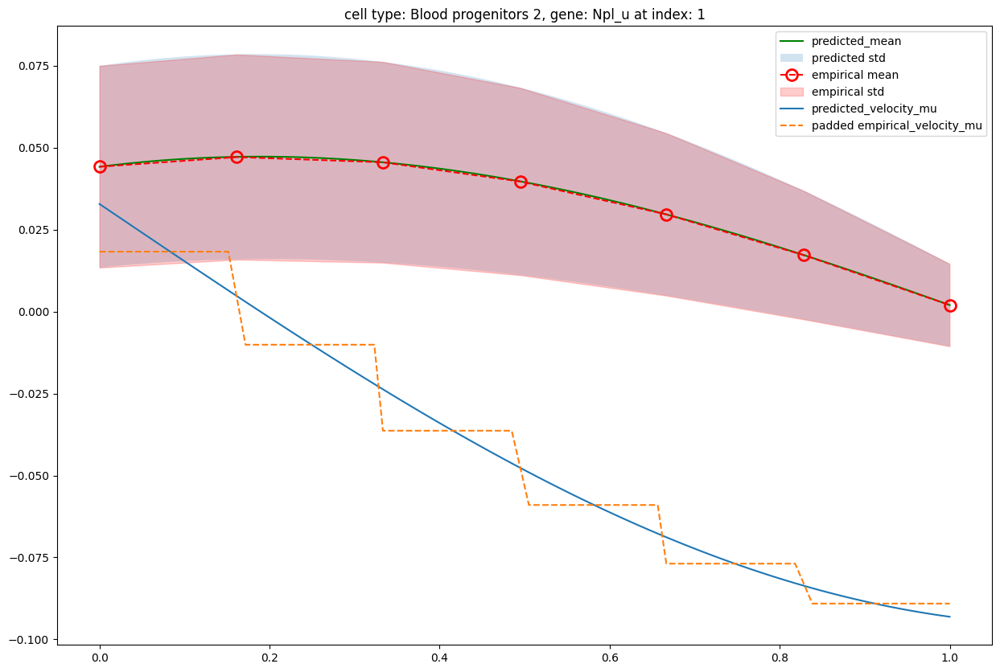

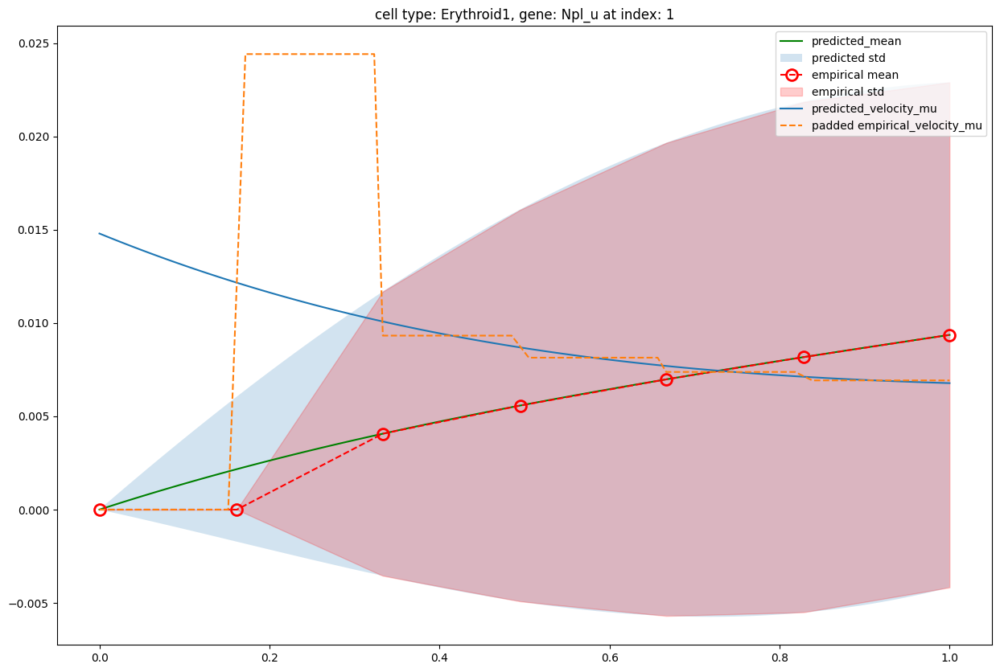

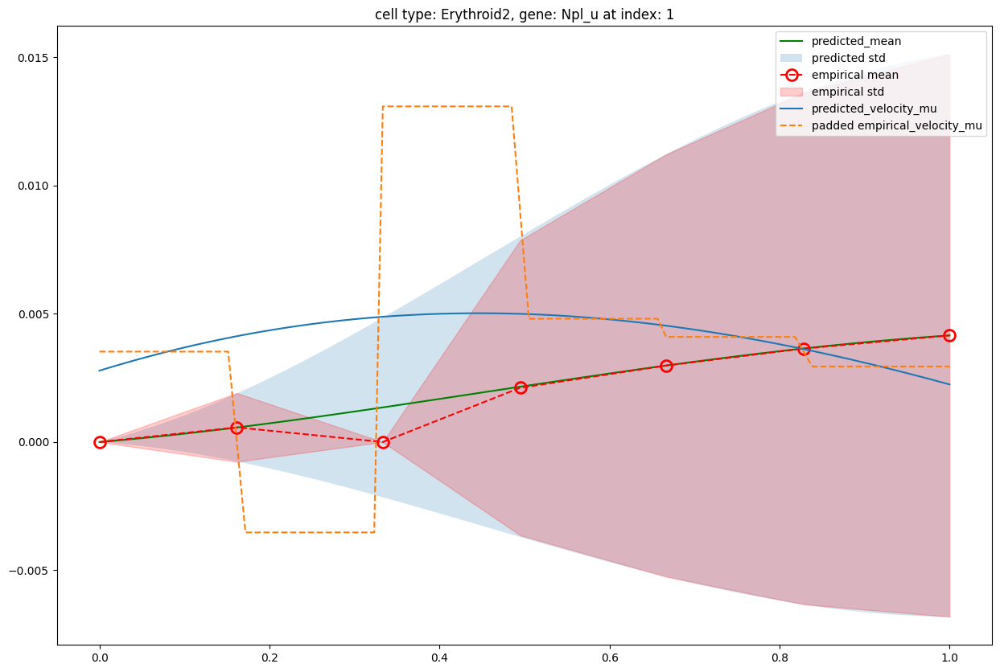

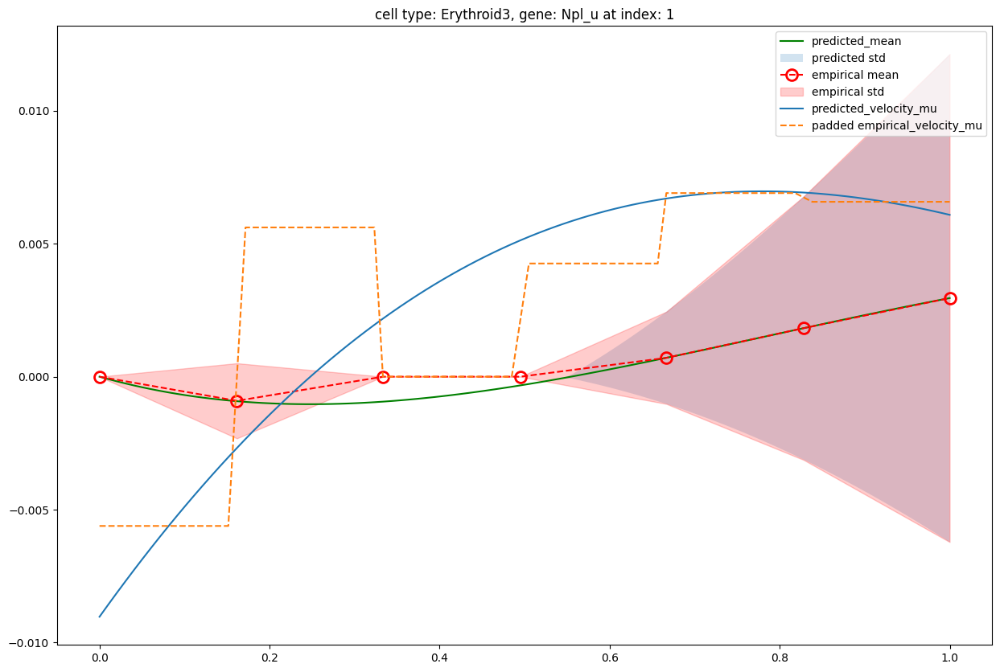

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming cell_types, adata.var_names, expr_dic_100, std_dic_100, synth_states_dic_100, synth_rates_dic_100, and predicted_std_dic_100 are defined
# Let's also assume t is defined and corresponds to the time points of your measurements

gene_idx = 1
gname = adata.var_names[gene_idx]

# Determine the indices for linearly spaced points including t0 and t_final
linear_indices = np.linspace(0, len(t)-1, 7, dtype=int)

for ctype_ind, ctype in enumerate(cell_types):
    plt.figure(figsize=(15,10))
    predicted_mean = predicted_mu_dic_100[ctype_ind][gene_idx]
    predicted_std = predicted_std_dic_100[ctype_ind][gene_idx]
    pred_velo_std = synth_rates_std_dic_100[ctype_ind][gene_idx]
    pred_velo_mu = synth_rates_dic_100[ctype_ind][gene_idx]
    empirical_means = expr_dic_100[ctype_ind][gene_idx][linear_indices]
    empirical_stds = std_dic_100[ctype_ind][gene_idx][linear_indices]
    t_numpy = np.array(t)
    empirical_velocity = np.diff(expr_dic_100[ctype_ind][gene_idx]) / np.diff(t.numpy())
    empirical_velocity_padded = np.append(empirical_velocity, empirical_velocity[-1])


    plt.plot(t, predicted_mean, c='g', label="predicted_mean")
    plt.fill_between(t, predicted_mean - predicted_std, predicted_mean + predicted_std, alpha=0.2, label="predicted std")
    t_empirical = t[linear_indices]
    plt.plot(t_empirical, empirical_means, 'o-', ms=10, mec='r', mfc='none', mew=2, linestyle='--', color='r', label="empirical mean")
    plt.fill_between(t_empirical, empirical_means - empirical_stds, empirical_means + empirical_stds, color='r', alpha=0.2, label="empirical std")
    plt.plot(t, pred_velo_mu, label="predicted_velocity_mu")
    plt.plot(t, empirical_velocity_padded, "--",label="padded empirical_velocity_mu")
    #plt.plot(t, velocity_std, label="predicted_velocity_std")
    #plt.plot(t, synth_states_dic_100[ctype_ind][gene_idx], "o", label="sampled synthetic data")

    plt.legend()
    plt.title(f"cell type: {ctype}, gene: {gname} at index: {gene_idx}")
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


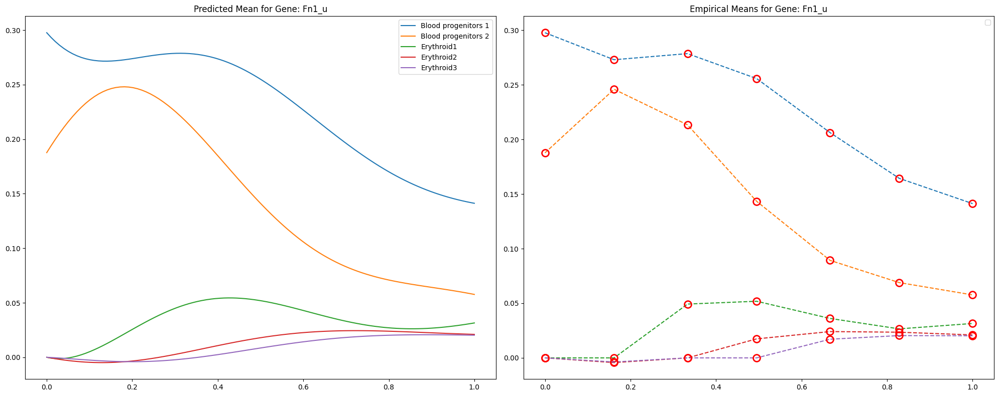

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


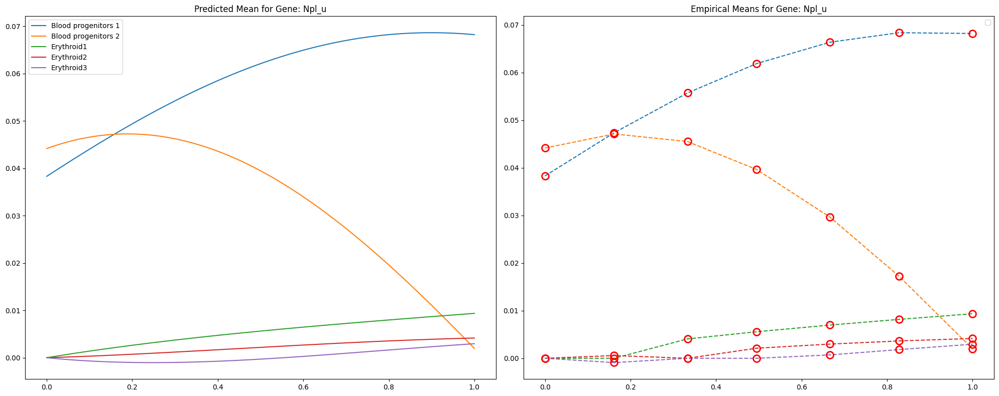

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


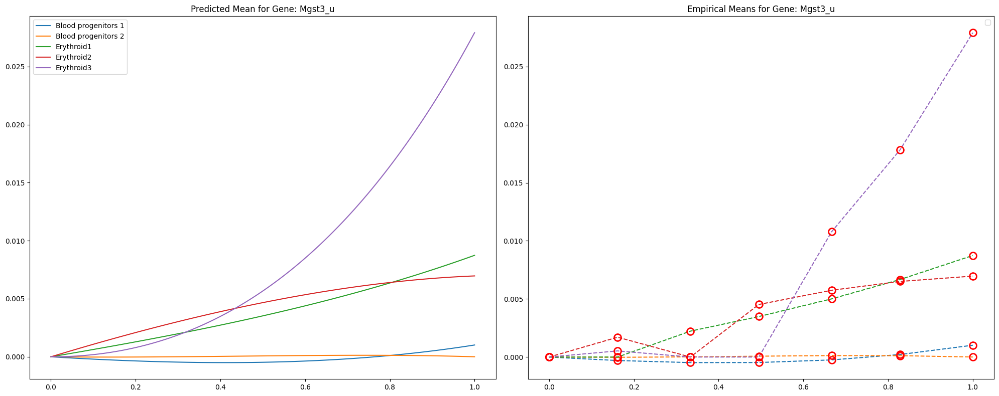

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


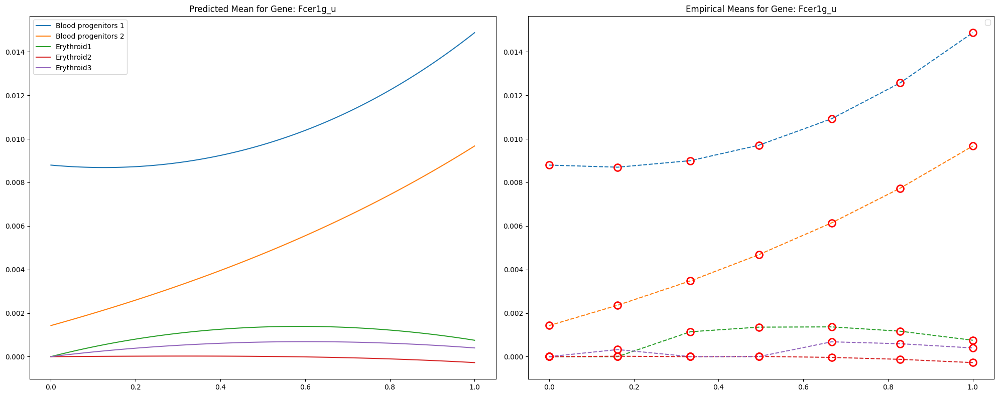

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


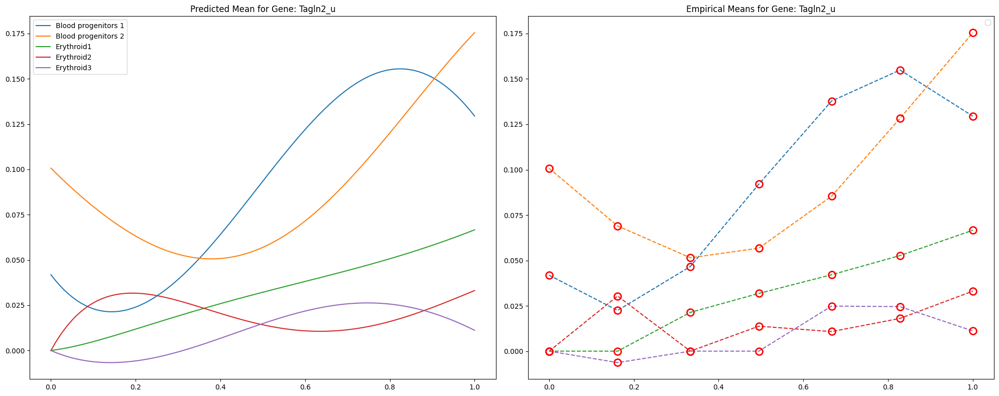

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming cell_types, adata.var_names, expr_dic_100, std_dic_100, synth_states_dic_100, synth_rates_dic_100, and predicted_std_dic_100 are defined
# Let's also assume t is defined and corresponds to the time points of your measurements

for gene_idx in range(5):
    gname = adata.var_names[gene_idx]

    # Determine the indices for linearly spaced points including t0 and t_final
    linear_indices = np.linspace(0, len(t)-1, 7, dtype=int)
    t_empirical = t[linear_indices]  # Ensure this is defined before using

    plt.figure(figsize=(20,8))

    # To avoid legend duplication, track the cell types you've added to the legend
    added_legends = set()

    for ctype_ind, ctype in enumerate(cell_types):
        # Plotting Predicted Means
        plt.subplot(1, 2, 1)
        predicted_mean = predicted_mu_dic_100[ctype_ind][gene_idx]
        if ctype not in added_legends:
            plt.plot(t, predicted_mean, label=ctype)  # Color 'g' is default, specify if needed
            added_legends.add(ctype)
        else:
            plt.plot(t, predicted_mean)  # Plot without adding to legend again
        
        # Plotting Empirical Means
        plt.subplot(1, 2, 2)
        empirical_means = expr_dic_100[ctype_ind][gene_idx][linear_indices]
        if ctype not in added_legends:
            plt.plot(t_empirical, empirical_means, 'o-', ms=10, mec='r', mfc='none', mew=2, linestyle='--', label=ctype)
            # 'color' parameter is redundant with 'mec', so it's removed
            added_legends.add(ctype)
        else:
            plt.plot(t_empirical, empirical_means, 'o-', ms=10, mec='r', mfc='none', mew=2, linestyle='--')

    # Adding legends outside the loop ensures each cell type is only added once
    plt.subplot(1, 2, 1)
    plt.legend()
    plt.title(f"Predicted Mean for Gene: {gname}")

    plt.subplot(1, 2, 2)
    plt.legend()
    plt.title(f"Empirical Means for Gene: {gname}")

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


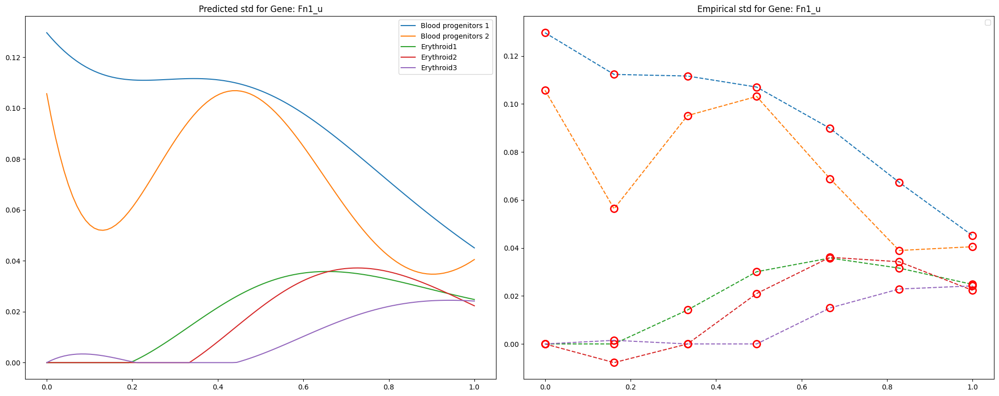

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


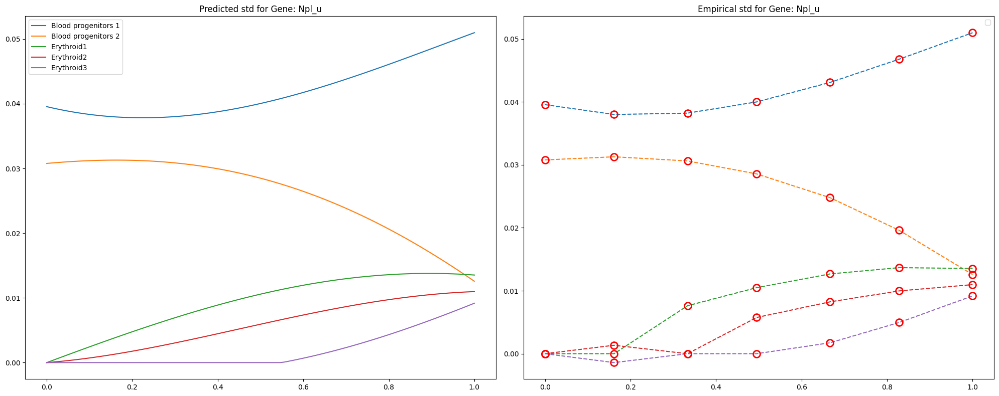

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


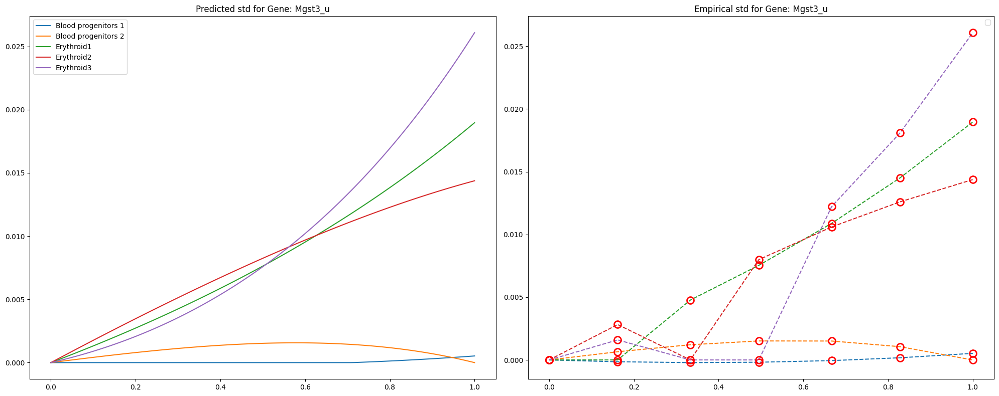

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


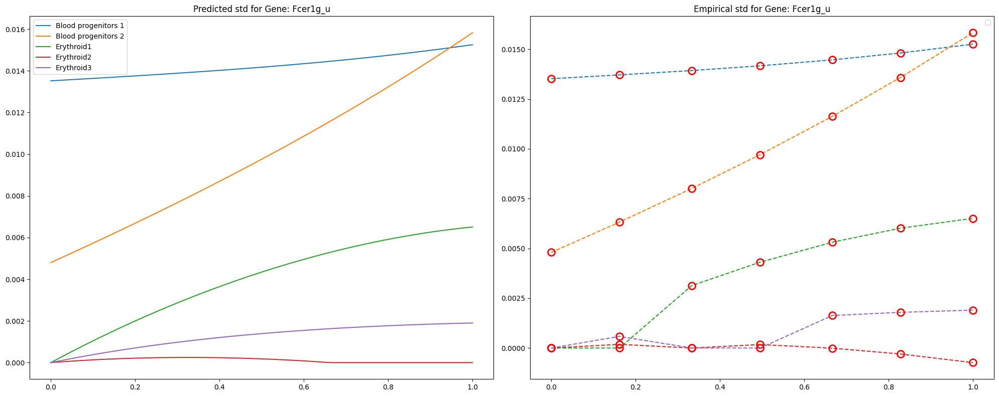

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


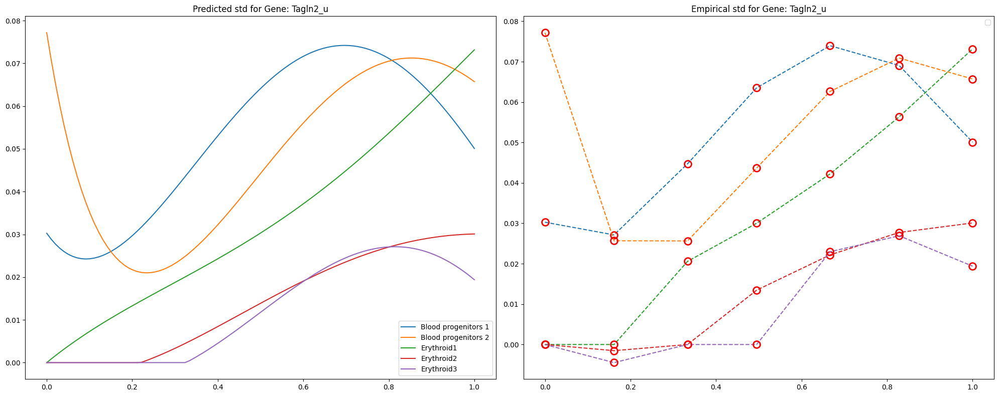

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming cell_types, adata.var_names, expr_dic_100, std_dic_100, synth_states_dic_100, synth_rates_dic_100, and predicted_std_dic_100 are defined
# Let's also assume t is defined and corresponds to the time points of your measurements

for gene_idx in range(5):
    gname = adata.var_names[gene_idx]

    # Determine the indices for linearly spaced points including t0 and t_final
    linear_indices = np.linspace(0, len(t)-1, 7, dtype=int)
    t_empirical = t[linear_indices]  # Ensure this is defined before using

    plt.figure(figsize=(20,8))

    # To avoid legend duplication, track the cell types you've added to the legend
    added_legends = set()

    for ctype_ind, ctype in enumerate(cell_types):
        # Plotting Predicted Means
        plt.subplot(1, 2, 1)
        predicted_std = predicted_std_dic_100[ctype_ind][gene_idx]
        empirical_stds = std_dic_100[ctype_ind][gene_idx][linear_indices]


        if ctype not in added_legends:
            plt.plot(t, predicted_std, label=ctype)  # Color 'g' is default, specify if needed
            added_legends.add(ctype)
        else:
            plt.plot(t, predicted_mean)  # Plot without adding to legend again
        
        # Plotting Empirical Means
        plt.subplot(1, 2, 2)
        if ctype not in added_legends:
            plt.plot(t_empirical, empirical_stds, 'o-', ms=10, mec='r', mfc='none', mew=2, linestyle='--', label=ctype)
            # 'color' parameter is redundant with 'mec', so it's removed
            added_legends.add(ctype)
        else:
            plt.plot(t_empirical, empirical_stds, 'o-', ms=10, mec='r', mfc='none', mew=2, linestyle='--')

    # Adding legends outside the loop ensures each cell type is only added once
    plt.subplot(1, 2, 1)
    plt.legend()
    plt.title(f"Predicted std for Gene: {gname}")

    plt.subplot(1, 2, 2)
    plt.legend()
    plt.title(f"Empirical std for Gene: {gname}")

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()


plots 1: predicted mean vs empirical mean (all celltypes)
plots 2: predicted dyf vs empirical dyf (all celltypes)
plots 3: predicted velocity mu vs empirical velocity mu (all celltypes)
plots 4: predicted velocity std vs empirical velocity std (all celltypes)
